# Covid-19 epidemiologic data

In this tutorial, we will use Wavy to prepare and analyze WHO data on COVID-19, which can be downloaded [here](https://covid19.who.int/WHO-COVID-19-global-data.csv).

First, we will import the necessary libraries:

In [53]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from tqdm import tqdm

from wavy import panel
from wavy import frequency
from wavy import utils

After that, we will load the .csv file into a Pandas DataFrame and take a look at its first few rows:

In [2]:
csv_path = '/home/amandacasadei/Downloads/WHO-COVID-19-global-data.csv'
df = pd.read_csv(csv_path)

In [3]:
df.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-03,AF,Afghanistan,EMRO,0,0,0,0
1,2020-01-04,AF,Afghanistan,EMRO,0,0,0,0
2,2020-01-05,AF,Afghanistan,EMRO,0,0,0,0
3,2020-01-06,AF,Afghanistan,EMRO,0,0,0,0
4,2020-01-07,AF,Afghanistan,EMRO,0,0,0,0


### Exploratory data analysis:

Next, we will perform an EDA on the data in order to elucidate its behavior. In the cell below, you can change the name of the variable "country" to see the descriptive statistics and charts for new and cumulative cases, as well as new and cumulative deaths.

           New_cases  Cumulative_cases   New_deaths  Cumulative_deaths
count     739.000000      7.390000e+02   739.000000         739.000000
mean    30445.906631      9.844434e+06   838.886333      272639.556157
std     25891.145488      8.287786e+06   804.010190      227954.584585
min      -573.000000      0.000000e+00     0.000000           0.000000
25%      9245.500000      1.558042e+06   223.000000       63719.500000
50%     25565.000000      7.753752e+06   674.000000      196561.000000
75%     47034.000000      1.893590e+07  1186.500000      529359.500000
max    150106.000000      2.249952e+07  4249.000000      619937.000000


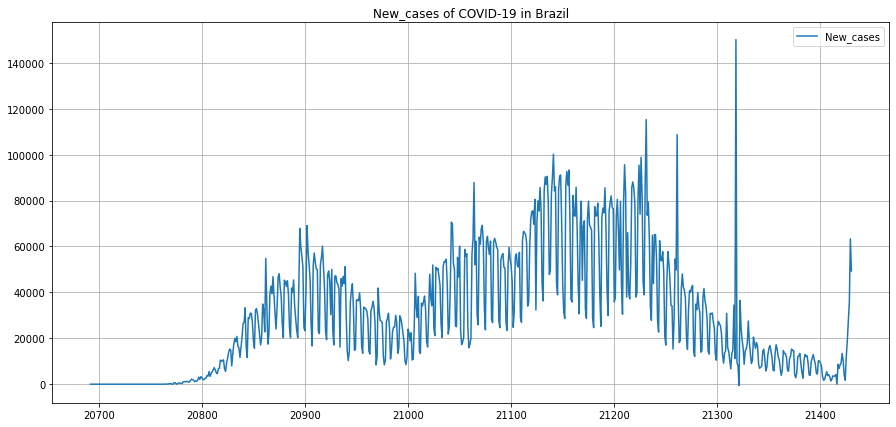

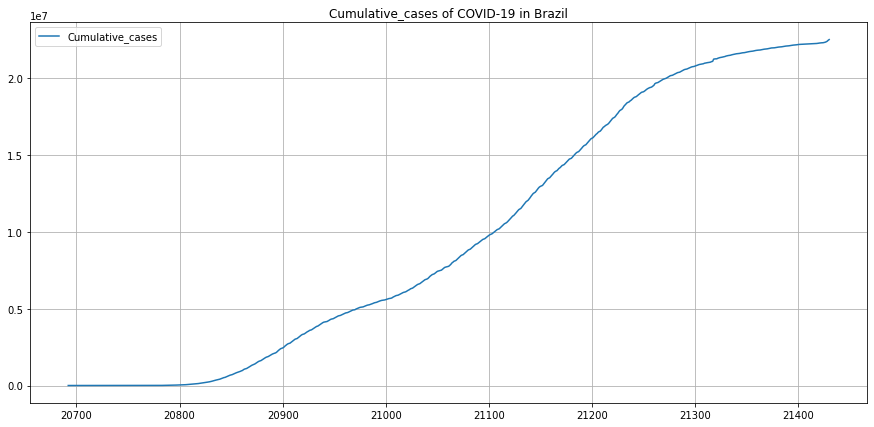

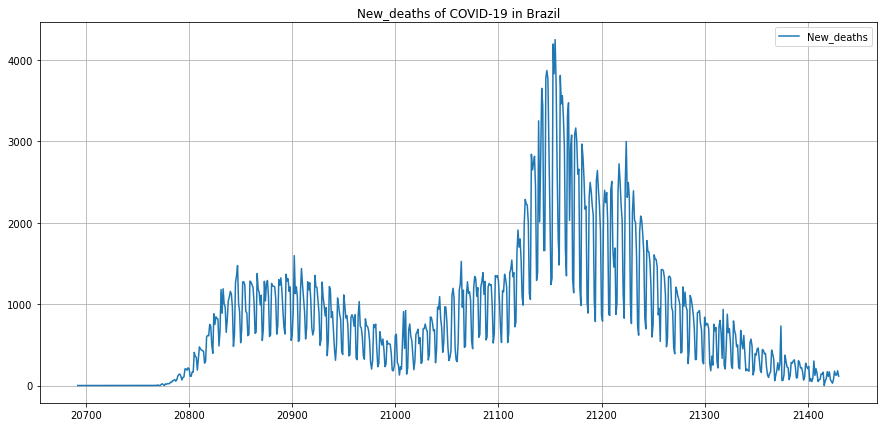

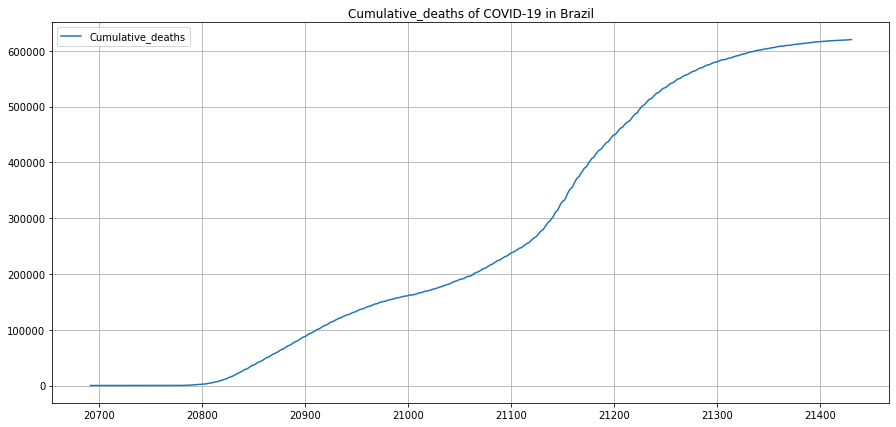

In [48]:
country = "Brazil"

aux_df = df.loc[df["Country"] == country]

print(aux_df.describe())

for metric in ["New_cases", "Cumulative_cases", "New_deaths", "Cumulative_deaths"]:   
    plt.figure(figsize=(15, 7))
    plt.plot(aux_df[metric])
    plt.title(f'{metric} of COVID-19 in {country}')
    plt.grid(True)
    plt.legend([metric])
    plt.show()

The data columns that are the most interesting for the purpose of time series forecasting and will therefore be used in this tutorial from now on are "New_cases" and "New_deaths". Please, note that negative numbers are only acceptable in these columns, as they may correspond to cases that were registered as COVID-19 and were later confirmed not to be the case.

Next, we will check the data for stationarity with an Augmented Dickey-Fuller unit root test for each time series. The null hypothesis of the test is that the data can be represented by a unit root concluding our data as not stationary.

In [55]:
X = aux_df['New_cases'].values

result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.601555
p-value: 0.482812
Critical Values:
	1%: -3.439
	5%: -2.866
	10%: -2.569


In [56]:
X = aux_df['New_deaths'].values

result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.711335
p-value: 0.425282
Critical Values:
	1%: -3.439
	5%: -2.866
	10%: -2.569


Because the p-value of both tests is > 0.05, we fail to reject the null hypothesis of the tests. Therefore, we must treat both of our time series as not stationary.

Next, we will check our data for autocorrelation. Note that it will be important in determining which model will be used for forecasting our time series. (Escrever um pouco mais sobre isso, mas antes preciso entender melhor como interpretar esse resultado)

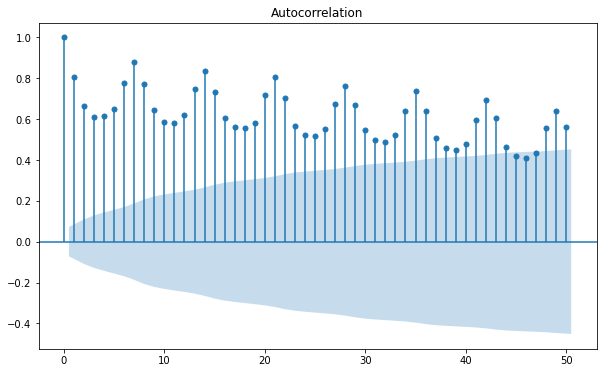

In [58]:
plt.rc("figure", figsize=(10,6))
sm.graphics.tsa.plot_acf(aux_df['New_cases'], lags=50);

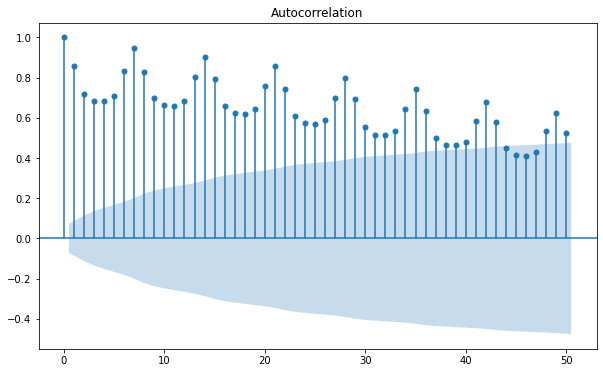

In [59]:
plt.rc("figure", figsize=(10,6))
sm.graphics.tsa.plot_acf(aux_df['New_deaths'], lags=50);

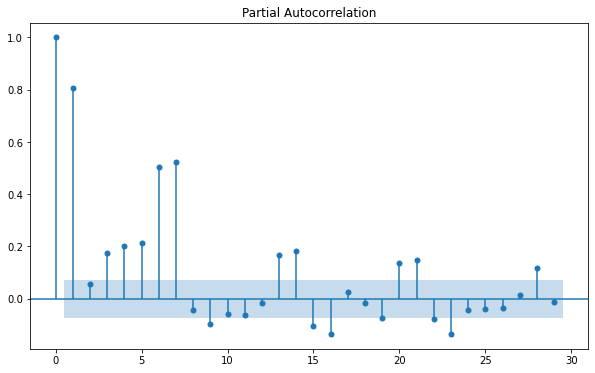

In [60]:
plt.rc("figure", figsize=(10,6))
sm.graphics.tsa.plot_pacf(aux_df['New_cases']);

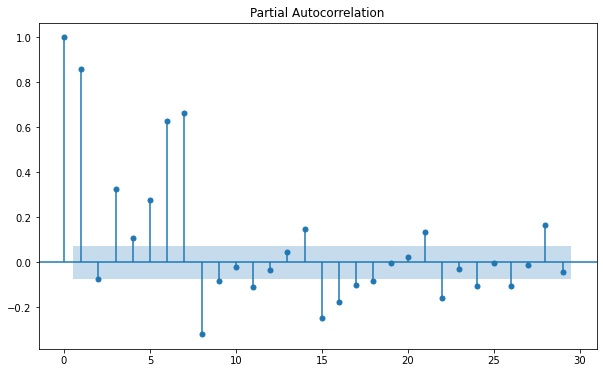

In [61]:
plt.rc("figure", figsize=(10,6))
sm.graphics.tsa.plot_pacf(aux_df['New_deaths']);

### Load dataframe into wavy panel:

In [65]:
panel_ = panel.from_single_level(df, lookback=10, horizon=1, gap=0, asset_column='Country', 
                                 index_name='Date_reported', assets=['Brazil', 'Argentina'], 
                                 channels=['New_cases', 'New_deaths'])

In [13]:
panel_.x[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-12-31         9128        112     42032         26
2022-01-01        13405        167     50506         35
2022-01-02        10282         72     67683         35
2022-01-03         3986         49         0          0
2022-01-04         1721         28     20502         23
2022-01-05        11850         76     44396         41
2022-01-06        18759        175     81210         49
2022-01-07        27267        129     95159         52
2022-01-08        35826        128    109608         40
2022-01-09        63292        181    110533         42

In [15]:
panel_.y[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2022-01-10        49303        115    101689         37

In [16]:
panel_.x.shape

  0%|          | 0/729 [00:00<?, ?it/s]

(729, 2, 10, 2)

In [17]:
panel_.y.shape

  0%|          | 0/729 [00:00<?, ?it/s]

(729, 2, 1, 2)

In [40]:
panel_.findna()

  0%|          | 0/729 [00:00<?, ?it/s]

  0%|          | 0/729 [00:00<?, ?it/s]

[]

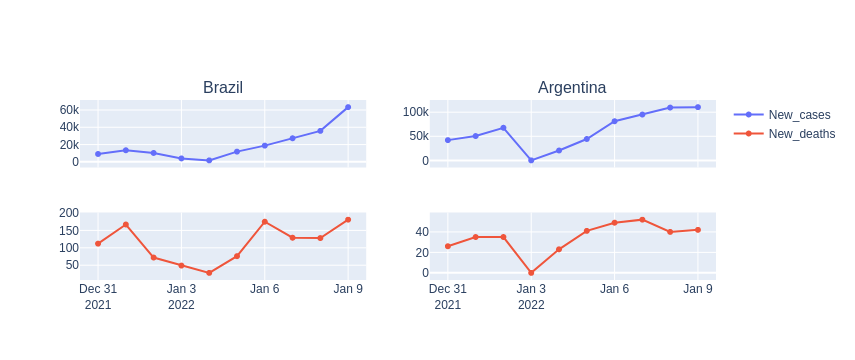

In [31]:
panel_.x[-1].plot()

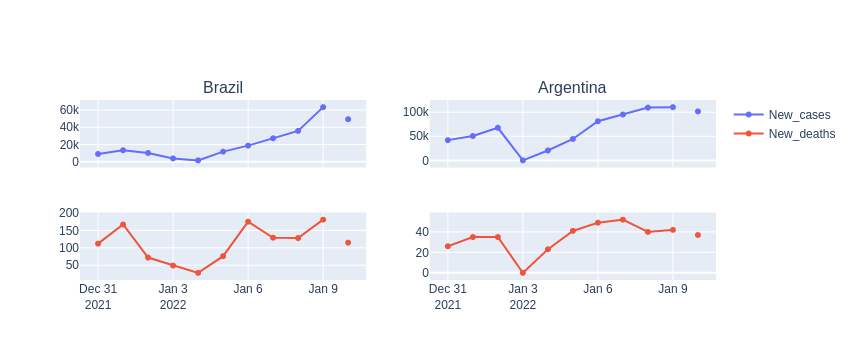

In [37]:
panel_.plot_block(-1)

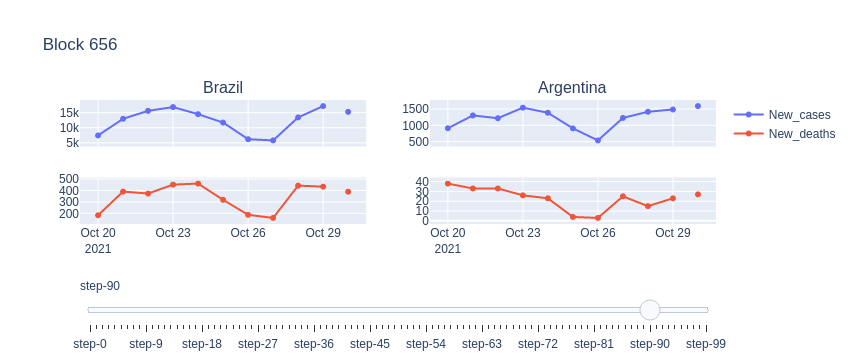

In [39]:
panel_.plot_slider()
#phyno!

### Train models:

In [41]:
panel_.set_training_split() #use default values of .2 for validation and .1 for test set

In [50]:
train = panel_.train
test = panel_.test
val = panel_.val

In [54]:
train.x[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-11        85748       2723     29757        605
2021-06-12        88092       2504     27628        669
2021-06-13        85149       2216     26934        687
2021-06-14        78700       2037     18057        447
2021-06-15        37948       1129     13043        268
2021-06-16        39846        827     21292        686
2021-06-17        80609       2468     27260        586
2021-06-18        95367       2997     25878        646
2021-06-19        74042       2311     23780        528
2021-06-20        98832       2495     20363        458

In [55]:
from wavy import nn

### Baseline

In [58]:
baseline = nn.Baseline(panel_, metrics=['SE', 'MSE', 'RMSE'])

In [59]:
predicted = baseline.predict()

In [67]:
predicted[0]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-10-31        15268        389      1589         27

In [69]:
panel_.test.y[0]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-10-31        11965        394      2185         26

In [72]:
baseline.evaluate('test')

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

[10536245773, 36584186.71180555, 6048.486315749218]

In [74]:
predicted_val = baseline.predict_val()

In [75]:
baseline.evaluate('val')

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

ValueError: operands could not be broadcast together with shapes (131,1,4) (72,1,4) 

In [78]:
panel_.val.y[5]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-27        79277       2001     24023        541

In [86]:
predicted_val[5]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-27        73602       2032     24463        452

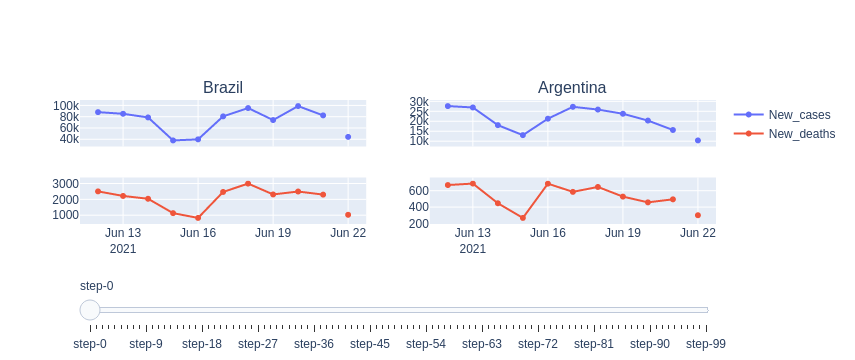

In [105]:
panel_.val.plot_slider()

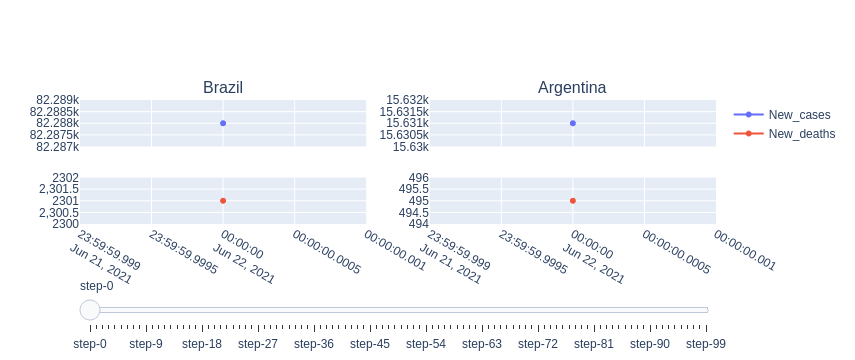

In [107]:
predicted_val.plot_slider()

### Dense

In [114]:
densemodel = nn.DenseModel(panel_, model_type="regression", dense_layers=4, optimizer='ADAM', loss='MSE')

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

In [115]:
densemodel.fit()

17/17 [==============================] - 0s 7ms/step - loss: 133315624.0000 - MAE: 7219.9067 - val_loss: 127813160.0000 - val_MAE: 6318.5488


In [116]:
densemodel.model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_5 (Flatten)         (None, 40)                0         
                                                                 
 dense_10 (Dense)            (None, 32)                1312      
                                                                 
 dense_11 (Dense)            (None, 4)                 132       
                                                                 
 reshape_5 (Reshape)         (None, 1, 4)              0         
                                                                 
Total params: 1,444
Trainable params: 1,444
Non-trainable params: 0
_________________________________________________________________


In [117]:
predicted = densemodel.predict()

In [118]:
densemodel.evaluate('test')

3/3 [==============================] - 0s 2ms/step - loss: 345578976.0000 - MAE: 6485.7402


[345578976.0, 6485.740234375]

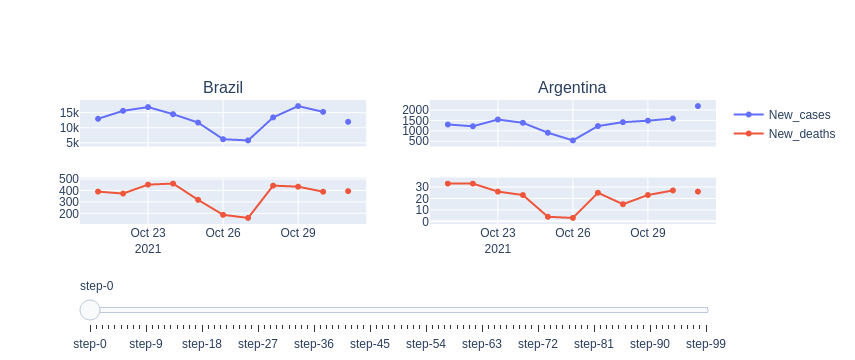

In [119]:
panel_.test.plot_slider()

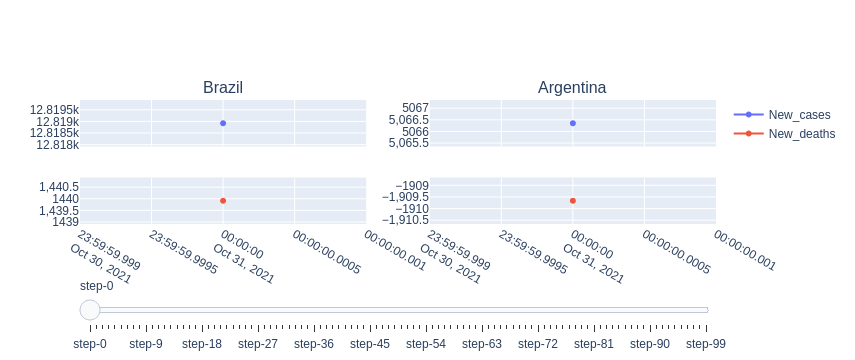

In [120]:
predicted.plot_slider()

In [122]:
predicted_val = densemodel.predict_val()

In [123]:
densemodel.evaluate('val')

5/5 [==============================] - 0s 1ms/step - loss: 127813160.0000 - MAE: 6318.5488


[127813160.0, 6318.548828125]

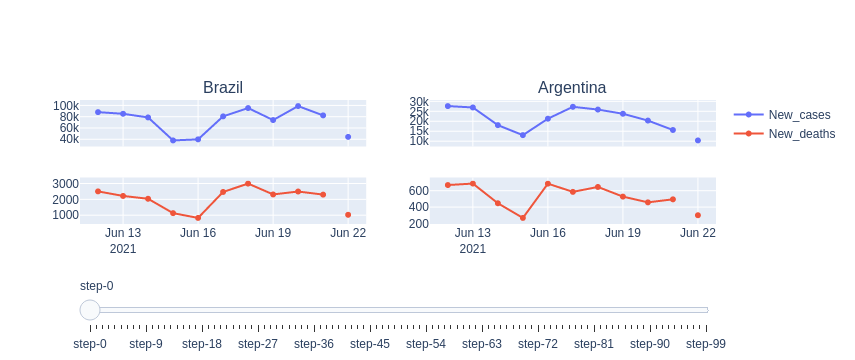

In [132]:
panel_.val.plot_slider()

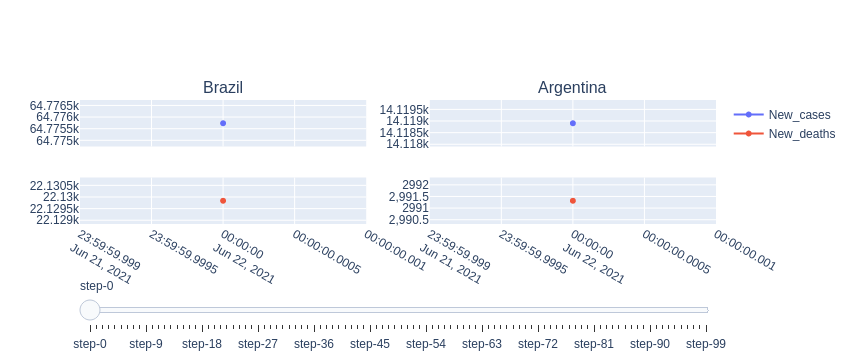

In [133]:
predicted_val.plot_slider()

### ConvModel

In [128]:
convmodel = nn.ConvModel(panel_, model_type="regression", kernel_size=2)

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

In [131]:
convmodel.fit()

TypeError: in user code:

    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 878, in train_function  *
        return step_function(self, iterator)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 867, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 860, in run_step  **
        outputs = model.train_step(data)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 808, in train_step
        y_pred = self(x, training=True)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/utils/traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None

    TypeError: Exception encountered when calling layer "conv1d_1" (type Conv1D).
    
    Value passed to parameter 'input' has DataType int64 not in list of allowed values: float16, bfloat16, float32, float64, int32
    
    Call arguments received:
      • inputs=tf.Tensor(shape=(None, 10, 4), dtype=int64)


In [130]:
convmodel.model.summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.